

---


READ ME : Whenever the mpimg.read function is called the following path nededs to be the path where the images are located in this case it is my Google Drive

---





In [ ]:
#Initial Setup 

from google.colab import drive
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
drive.mount('/content/drive')
!pip install opencv-contrib-python==3.4.2.16

#Linking my personal drive
# path = '/content/drive/My Drive/ECSE 415/A2-415/images/'
path = '/content/drive/MyDrive/ECSE 415/A2-415/images/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 1. Harris Corner Detection

In [ ]:
#Implementing the Harris Corner Detector
#Sources used : https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html


def harrisCorner(image, threshold, k, d=5) : 

  height = image.shape[0]
  width = image.shape[1]
  har = np.zeros((height,width))



  #Step 1 : Compute image derivatives with the sobel operator 

  image_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
  image_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)



  #Step 2 : Compute the square of the derivatives

  image_x_square = np.square(image_x)
  image_y_square = np.square(image_y)
  image_x_y = image_x * image_y

  
  #Step 3 : Apply gaussian filtering to the squared outputs

  image_x_square = cv2.GaussianBlur(image_x_square, (5, 5), 0)
  image_y_square = cv2.GaussianBlur(image_y_square, (5, 5), 0)
  image_x_y = cv2.GaussianBlur(image_x_y, (5, 5), 0)



 

  #Step 4 : Cornerness function response  det(H) - ktrace(H)^2

  image_x_y_square = np.square(image_x_y)

  det = image_x_square*image_y_square-image_x_y_square
      
  trace = image_x_square+image_y_square
     
  har = det - k*np.square(trace)
  


  #Step 5 : Non-maxima suppression Source inspiration : https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123

  #Creating an angle matrix
  angles = cv2.phase(image_x, image_y, angleInDegrees=True)

  M, N = har.shape
  suppression = np.zeros((M,N), dtype=np.int32)
  #Iterate through every pixel skipping borders
  
  for i in range(1,M-1): # Note that we are leaving 1 pixel gap on each side of image
      for j in range(1,N-1):

      # neighbourhood pixels in variables q and r
        q = 255
        r = 255

        #angle 0
        if (0 <= angles[i,j] < 22.5 or 157.5 <= angles[i,j] <= 180):
          q = har[i, j+1]
          r = har[i, j-1]
          #angle 45
        elif (22.5 <= angles[i,j] < 67.5):
          q = har[i+1, j-1]
          r = har[i-1, j+1]
              #angle 90
        elif (67.5 <= angles[i,j] < 112.5):
          q = har[i+1, j]
          r = har[i-1, j]
              #angle 135
        elif (112.5 <= angles[i,j] < 157.5):
          q = har[i-1, j-1]
          r = har[i+1, j+1]

              # if pixel magnitude is higher than both its neighbour than keep     
        if (har[i,j] >= q) and (har[i,j] >= r):
          suppression[i,j] = har[i,j]
        # otherwise make its value to 0
        else:
          suppression[i,j] = 0



  #Make corners visible 
  newimg = image.copy()
  image_color = cv2.cvtColor(newimg, cv2.COLOR_GRAY2RGB)



  
  for i in range (0, width):
    for j in range (0, height):
      if suppression[j,i] > threshold:
          cv2.circle(image_color, (i,j),d, (0,0,255,0), -1)
    
  return image_color





##1.1 Harris Corner Detector on checkerboard image 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


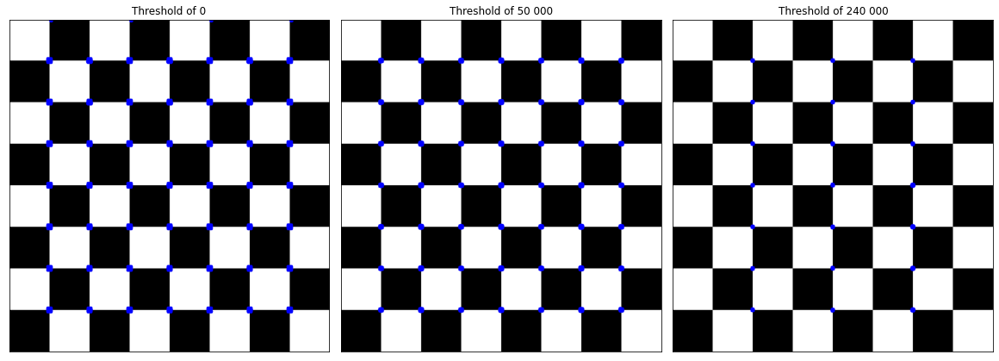

In [ ]:
# Load checkerboard
checkerboard = mpimg.imread(path+'checkerboard.png')
gray_board = cv2.cvtColor(checkerboard, cv2.COLOR_RGB2GRAY)

# Threshold of 0 
t_1 = harrisCorner(gray_board, 0, 0.04)
t_2 = harrisCorner(gray_board, 50000, 0.04)
t_3 = harrisCorner(gray_board, 240000, 0.04)

# Display images
plt.figure(figsize=(16, 20), constrained_layout=True)
plt.subplot(131), plt.imshow(t_1)
plt.title("Threshold of 0"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(t_2)
plt.title("Threshold of 50 000"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(t_3)
plt.title("Threshold of 240 000"), plt.xticks([]), plt.yticks([])
plt.show()

Here the corner detector was tested with thresholds of 0 , 50 000 and 200 000, When the threshold is zero we are able to detect all corners properly. Once we start increasing , the amount of pixels described as part of a corner and the number of corner distinguished starts diminishing. Indeed, the corners that disappear have a lower cornerness score , and therefore are not being picked up as a value that should be colored as the threshold increases. 

## 1.2 Harris Corner Detector on a shape image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


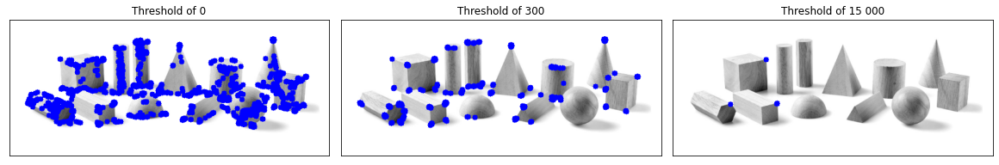

In [ ]:
shapes = mpimg.imread(path+'shapes.png')
gray_shapes = cv2.cvtColor(shapes, cv2.COLOR_RGB2GRAY)

#Threshold of 0 
t_shapes_1 = harrisCorner(gray_shapes, 0, 0.04)
t_shapes_2 = harrisCorner(gray_shapes, 300, 0.04)
t_shapes_3 = harrisCorner(gray_shapes, 15000, 0.04)


plt.figure(figsize=(16, 20), constrained_layout=True)
plt.subplot(131), plt.imshow(t_shapes_1)
plt.title("Threshold of 0"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(t_shapes_2)
plt.title("Threshold of 300"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(t_shapes_3)
plt.title("Threshold of 15 000"), plt.xticks([]), plt.yticks([])
plt.show()

Similar to the test with the checkerboard, the lower the treshold the more corners were detected. However, here with the threshold of 0 we can notice that a couple of false positives were detected , especially in the cone and in the face of the shapes , this can be due to the changes in lighting , and the different curves that can be mistaken for corners. A treshold of 300 gave a pretty accurate representation of the corners , and a treshold of 15 000 missed most of them as the threshold was too high and the cornerness score of the correct corners too low. 

##1.3 Harris Corner Detector on a face image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


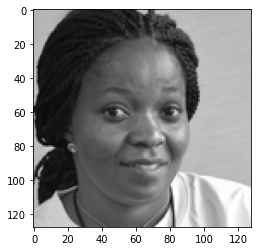

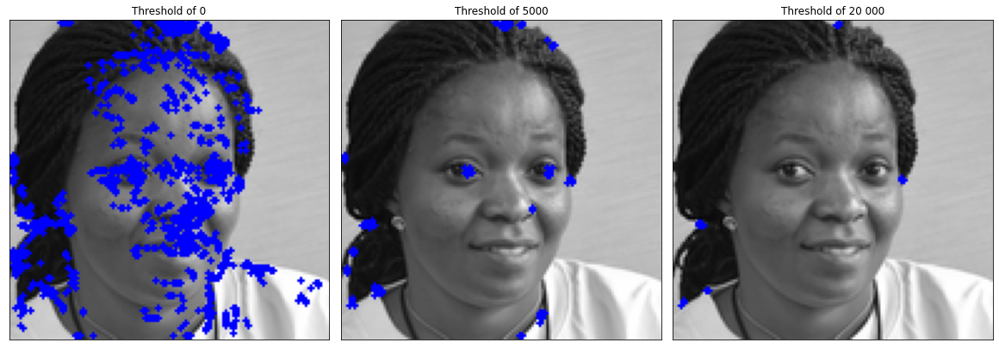

In [ ]:
face = mpimg.imread(path+'face.png')

gray_face = cv2.cvtColor(face, cv2.COLOR_RGB2GRAY)

image_color = cv2.cvtColor(gray_face, cv2.COLOR_GRAY2RGB)

plt.imshow(image_color)
#Threshold of 0 
t_face_1 = harrisCorner(gray_face, 0, 0.04, 1)
t_face_2 = harrisCorner(gray_face, 5000, 0.04 , 1)
t_face_3 = harrisCorner(gray_face, 20000, 0.04 , 1)


plt.figure(figsize=(16, 20), constrained_layout=True)
plt.subplot(131), plt.imshow(t_face_1)
plt.title("Threshold of 0"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(t_face_2)
plt.title("Threshold of 5000"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(t_face_3)
plt.title("Threshold of 20 000"), plt.xticks([]), plt.yticks([])
plt.show()

Similar to the example with the shapes , the threshold of 0 generated a lot of false positives because it's difficult to distinguish what qualifies as a corner in the face due to curves so a lot of of points had a cornerness score above 0. The threshold that gave a result closest to reality was 5000 , although it didn't distinguish the corners of the eyes and mouth properly, it didn't generate too many false positives on flat surfaces , and distinguished the corners around the hair, the nose , the inner corners of the eyes and the collar of the shirt. The highest threshold of 20 000 only generated a few corners  in the hair , we can also notice that these corners are in the areas that had the most colored pixels in previous thresholds because they have a higher cornerness score , which makes sense because we can tell they are indeed quite obvious corners. 

# 2. Invariance of SIFT features

## 2.1 Invariance Under Scale

### 2.1.1 Compute SIFT keypoints for the reference image

In [ ]:
#Method to compute SIFT keypoints Source inspiration : Tutorial 4 ECSE 415 Winter 2021

def computeSIFT (image): 

  image_copy = image.copy()

  # convert to RGB to be able to apply the Open CV function later on

  sift = cv2.xfeatures2d.SIFT_create()

  keypoints = sift.detect(image, None)

  cv2.drawKeypoints(image, keypoints, image_copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  return image_copy

In [ ]:
# Source inspiration : Tutorial 4 ECSE 415 Winter 2021
book = cv2.imread(path+"book.jpg")

# 2.1.1 Compute SIFT keypoints for the reference image
book = cv2.cvtColor(book, cv2.COLOR_BGR2RGB)

book2 = computeSIFT(book)

error: ignored

###2.1.2  Scale reference image using scaling factors of (0.2, 0.8, 2, 5).

In [ ]:

#Source inspiration: https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/

def resizeimage (factor, image): 

  width = int(image.shape[1] * factor)
  height = int(image.shape[0] * factor)
  dimensions = (width, height)
  
  # resize image
  resized = cv2.resize(image, dimensions, interpolation = cv2.INTER_AREA)

  return resized

Factor of 0.2


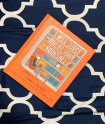

Factor of 0.8


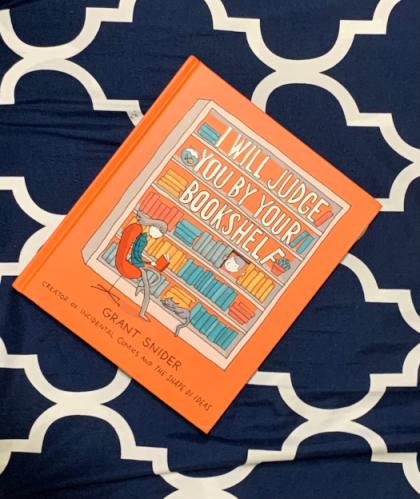

Factor of 2


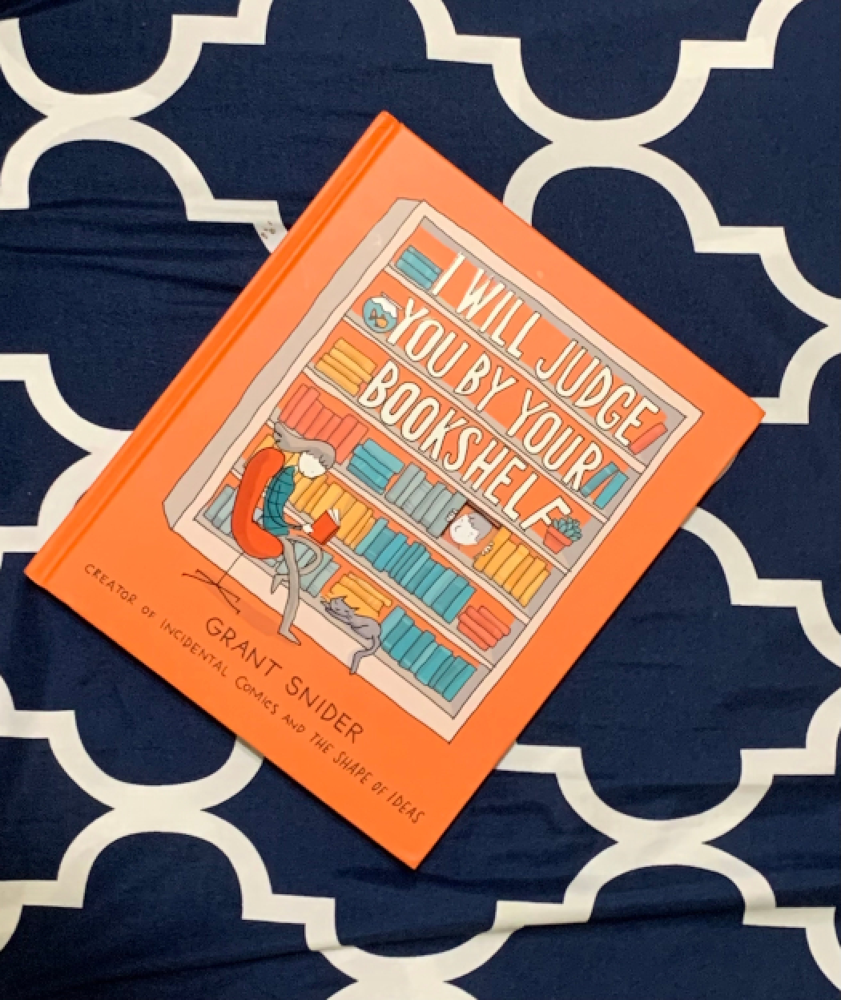

Factor of 5


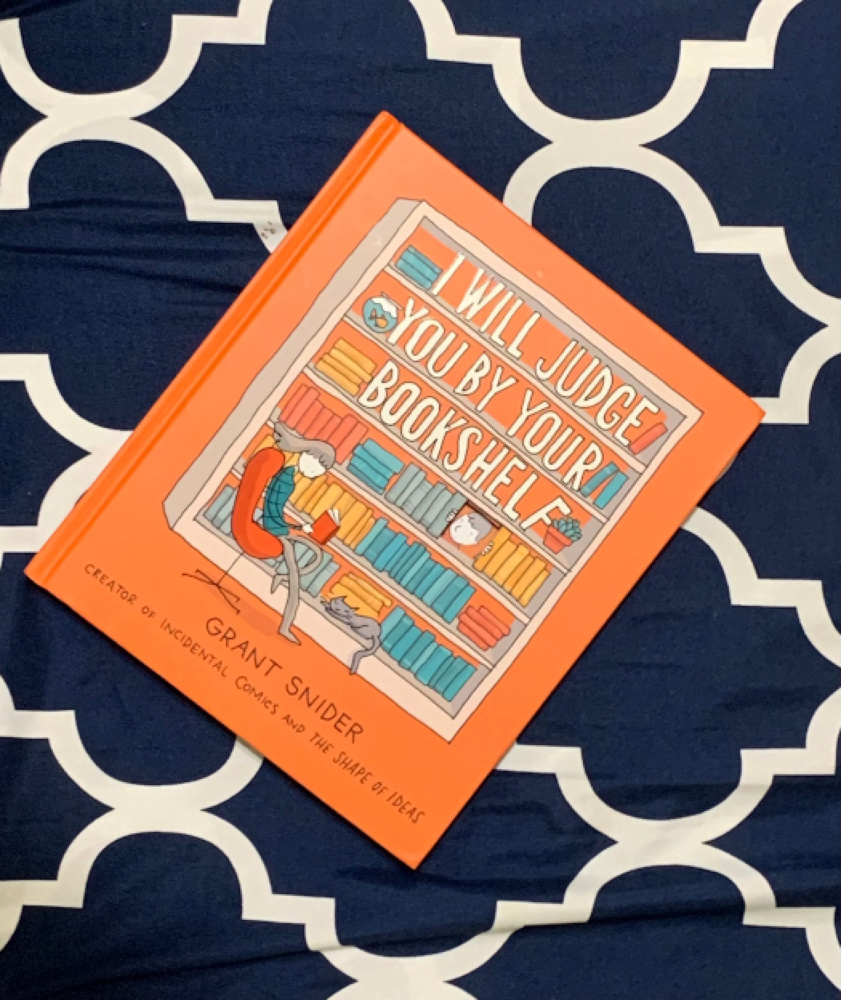

In [ ]:
book_to_scale = cv2.cvtColor(book, cv2.COLOR_BGR2RGB)

factor_02 = resizeimage(0.2, book_to_scale)
factor_08 = resizeimage(0.8, book_to_scale)
factor_2 = resizeimage(2, book_to_scale)
factor_5 = resizeimage(5, book_to_scale)

print("Factor of 0.2")
cv2_imshow(factor_02)
print("Factor of 0.8")
cv2_imshow(factor_08)
print("Factor of 2")
cv2_imshow(factor_2)
print("Factor of 5")
cv2_imshow(factor_5)

###2.1.3 Compute SIFT keypoints for all (total 4) transformed images.

In [ ]:
factor_02_copy = computeSIFT(factor_02)
factor_08_copy = computeSIFT(factor_08)
factor_2_copy = computeSIFT(factor_2)
factor_5_copy = computeSIFT(factor_5)

error: ignored

### 2.1.4 Match all keypoints of the reference image to the transformed images using a brute-force method.

In [ ]:
#Source inspiration : Tutorial 4 ECSE 415 Winter 2021

sift = cv2.xfeatures2d.SIFT_create()

#Reference image 
keypoints_ref, descriptors_ref = sift.detectAndCompute(book_to_scale,None)

#Scaled images 
keypoints_02,descriptors_02 = sift.detectAndCompute(factor_02,None)
keypoints_08,descriptors_08 = sift.detectAndCompute(factor_08,None)
keypoints_2,descriptors_2 = sift.detectAndCompute(factor_2,None)
keypoints_5,descriptors_5 = sift.detectAndCompute(factor_5,None)

bf = cv2.BFMatcher()


# Match descriptors.
matches_02 = bf.match(descriptors_ref,descriptors_02)
matches_08 = bf.match(descriptors_ref,descriptors_08)
matches_2 = bf.match(descriptors_ref,descriptors_2)
matches_5 = bf.match(descriptors_ref,descriptors_5)

error: ignored

###2.1.5 Sort matching key points according to the matching distance.

###2.1.6 Display the top ten matched keypoints for each pair of the reference image and a transformed image. 

In [ ]:
matches_02 = sorted(matches_02, key = lambda x:x.distance)
matches_08 = sorted(matches_08, key = lambda x:x.distance)
matches_2 = sorted(matches_2, key = lambda x:x.distance)
matches_5 = sorted(matches_5, key = lambda x:x.distance)

NameError: ignored

Match between the reference image and the book scaled by 0.2


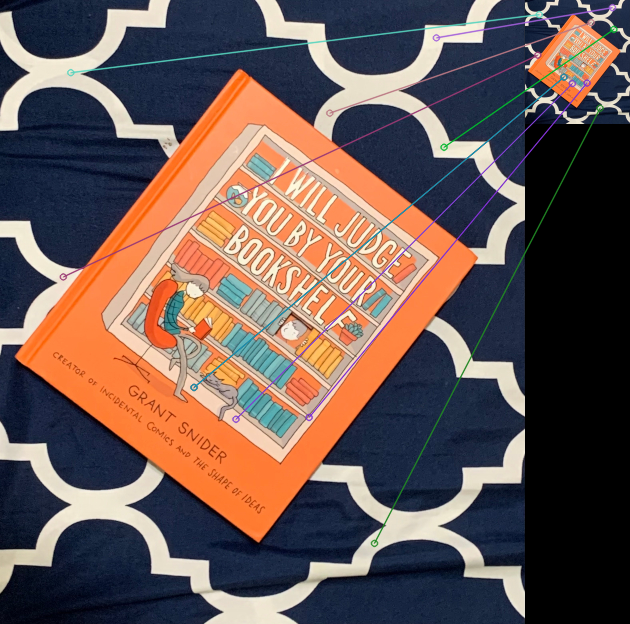

Match between the reference image and the book scaled by 0.8


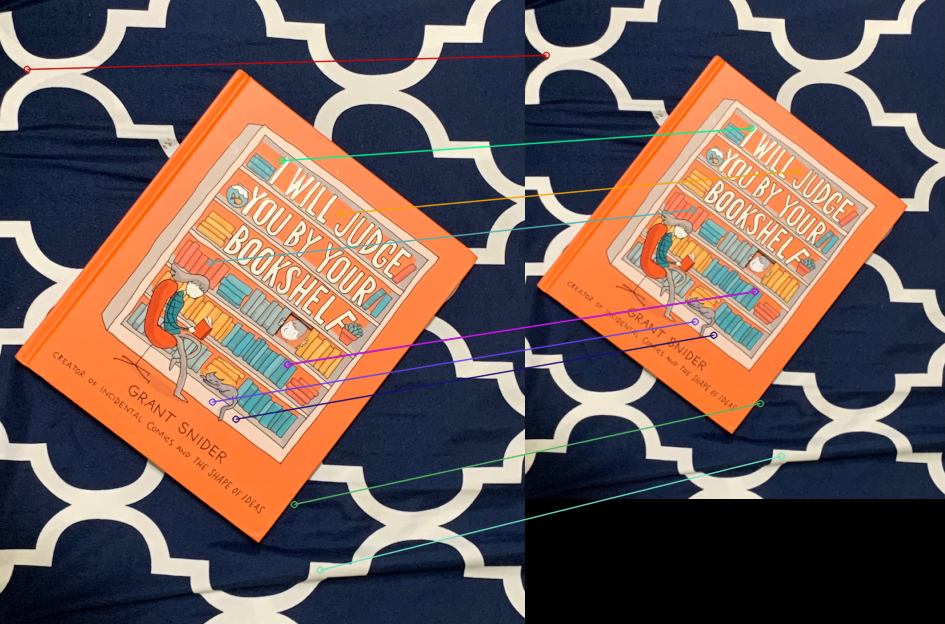

Match between the reference image and the book scaled by 2


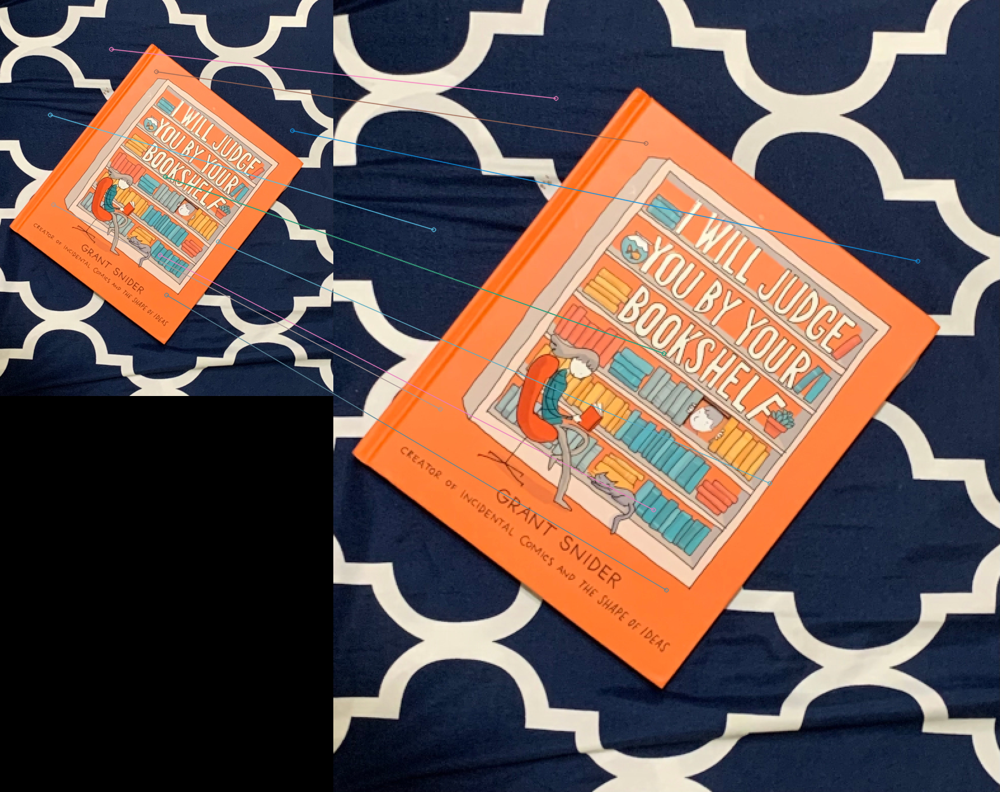

Match between the reference image and the book scaled by 5


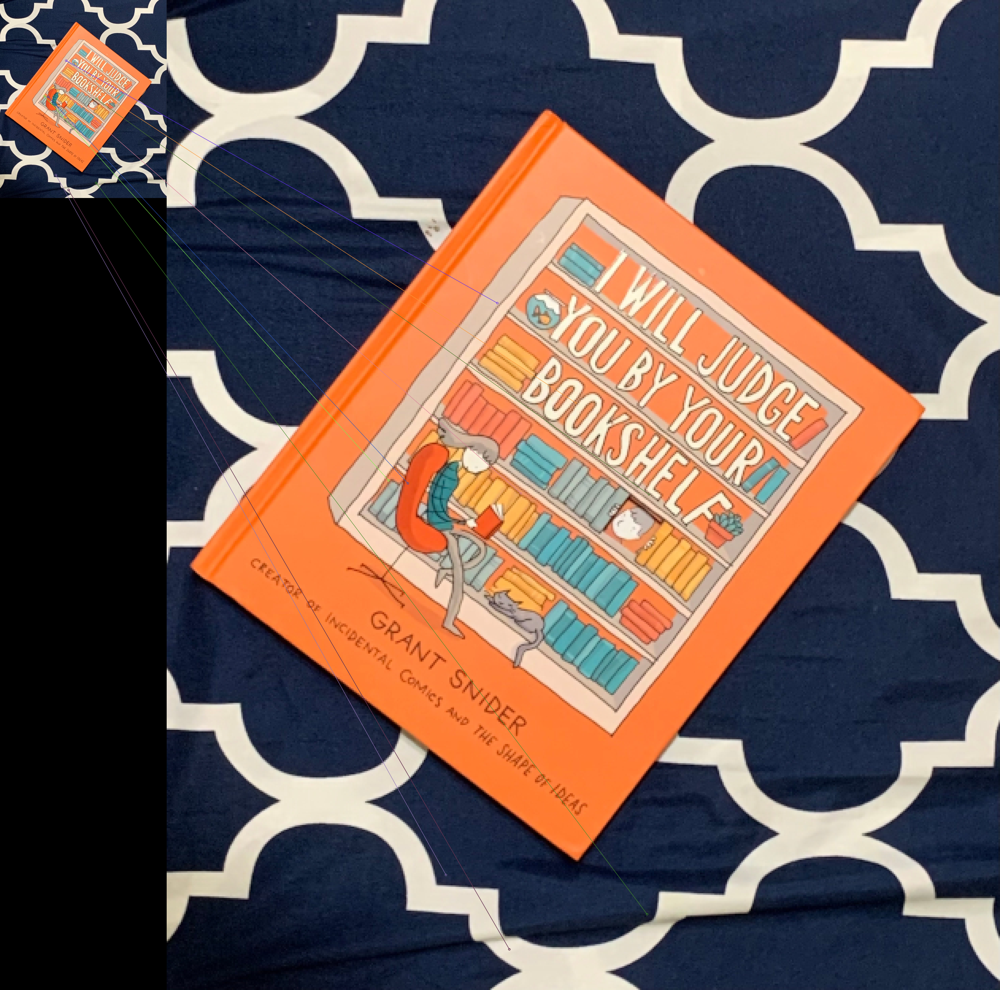

In [ ]:
book_02_match = cv2.drawMatches(book_to_scale,keypoints_ref, factor_02,keypoints_02, matches_02[:10], None, flags=2)
book_08_match = cv2.drawMatches(book_to_scale,keypoints_ref, factor_08,keypoints_08, matches_08[:10], None, flags=2)
book_2_match = cv2.drawMatches(book_to_scale,keypoints_ref, factor_2,keypoints_2, matches_2[:10], None, flags=2)
book_5_match = cv2.drawMatches(book_to_scale,keypoints_ref, factor_5,keypoints_5, matches_5[:10], None, flags=2)

print("Match between the reference image and the book scaled by 0.2")
cv2_imshow(book_02_match)
print("Match between the reference image and the book scaled by 0.8")
cv2_imshow(book_08_match)
print("Match between the reference image and the book scaled by 2")
cv2_imshow(book_2_match)
print("Match between the reference image and the book scaled by 5")
cv2_imshow(book_5_match)


### 2.1.7 Plot the matching distance for the top 100 matched keypoints. Plot indices of keypoints on the x-axis and corresponding matching distance on the y- axis.

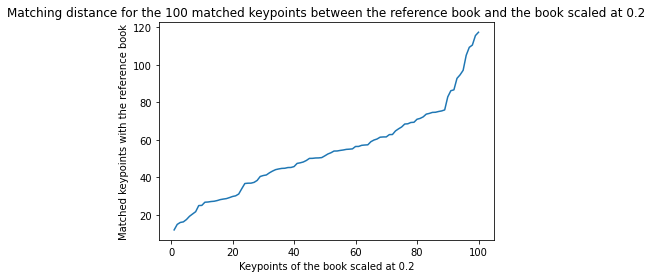

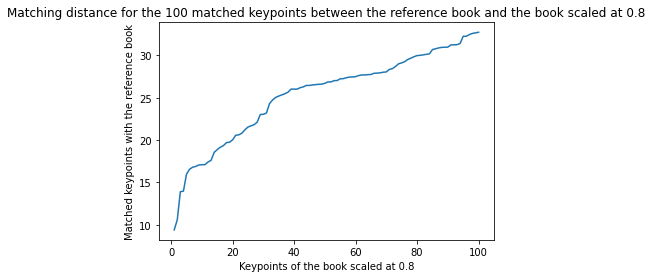

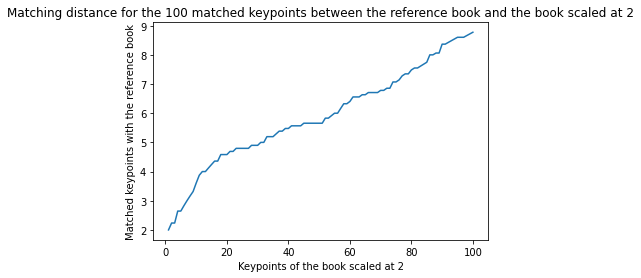

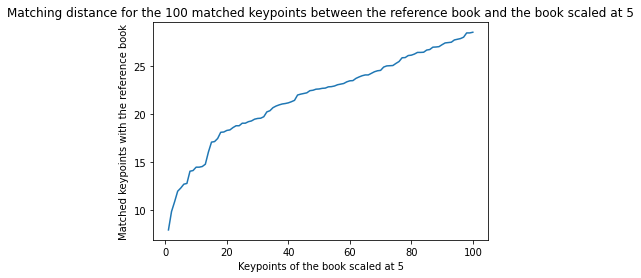

In [ ]:
def createPlot(matches): 
  x = []
  for i in range(1, 101):
    x.append(i)

  y = []
  for m in matches[:100]:
    y.append(m.distance)

  return x, y


#Book scaled at  0.2 

x_02, y_02 = createPlot(matches_02)
x_08, y_08 = createPlot(matches_08)
x_2, y_2 = createPlot(matches_2)
x_5, y_5 = createPlot(matches_5)
 
# function to show the plot 
plt.show() 



plt.plot(x_02, y_02) 
plt.xlabel('Keypoints of the book scaled at 0.2') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book scaled at 0.2')
plt.show()

plt.plot(x_08, y_08) 
plt.xlabel('Keypoints of the book scaled at 0.8') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book scaled at 0.8')
plt.show()

plt.plot(x_2, y_2) 
plt.xlabel('Keypoints of the book scaled at 2') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book scaled at 2')
plt.show()

plt.plot(x_5, y_5) 
plt.xlabel('Keypoints of the book scaled at 5') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book scaled at 5')
plt.show()

###2.1.8 Discuss the trend in the plotted results. What is the effect of increasing the scale on the matching distance? Reason the cause.

We can notice that increasing the scale of the image generates plots that are more and more linear. If we compare the plot of the image scaled at 0.2 , and the last one of the image that is 5 times larger we can see 

## 2.2 Invariance on rotation

### 2.2.1 Compute SIFT keypoints for the reference image.

### Rotate reference image at the angle of (10, 90, 130, 180). Display rotated images.

In [ ]:
#Source inspiration : Tutorial 4 ECSE 415 Winter 2021
book_rotation = cv2.imread(path+"book.jpg")


# 2.1.1 Compute SIFT keypoints for the reference image
book_rotation = cv2.cvtColor(book_rotation, cv2.COLOR_BGR2RGB)

book_rotation2 = computeSIFT(book_rotation)


In [ ]:
#Source : https://stackoverflow.com/questions/9041681/opencv-python-rotate-image-by-x-degrees-around-specific-point

def rotate(image, angle):
  center = tuple(np.array(image.shape[1::-1]) / 2)
  matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
  rotated = cv2.warpAffine(image, matrix, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return rotated


10 degree rotation


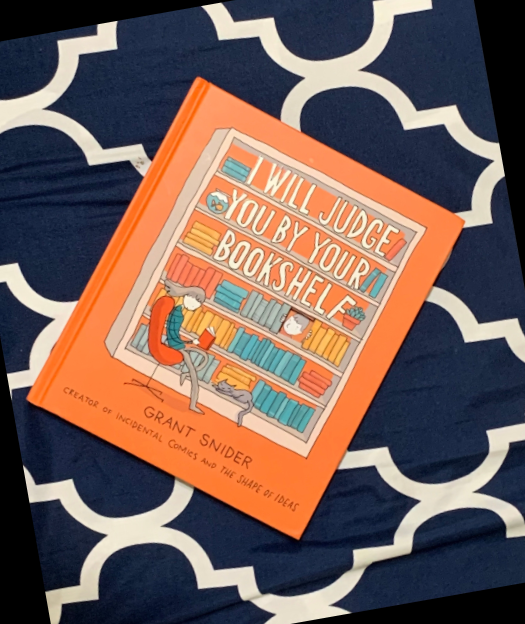

90 degree rotation


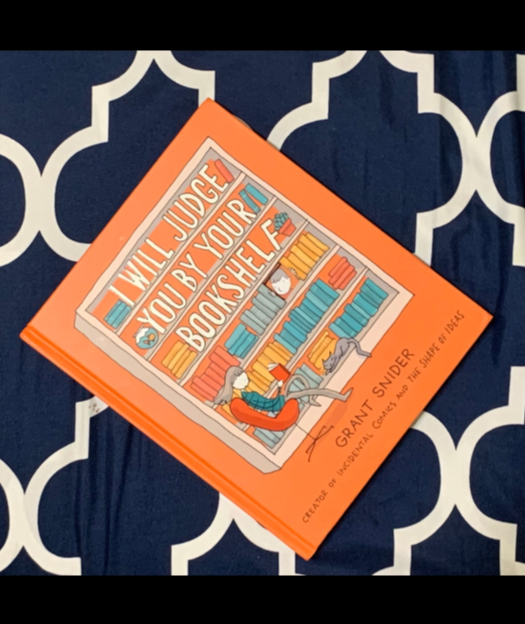

130 degree rotation


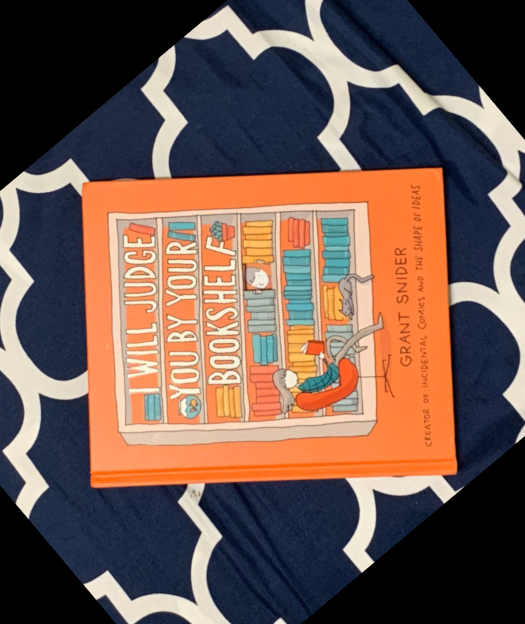

180 degree rotation


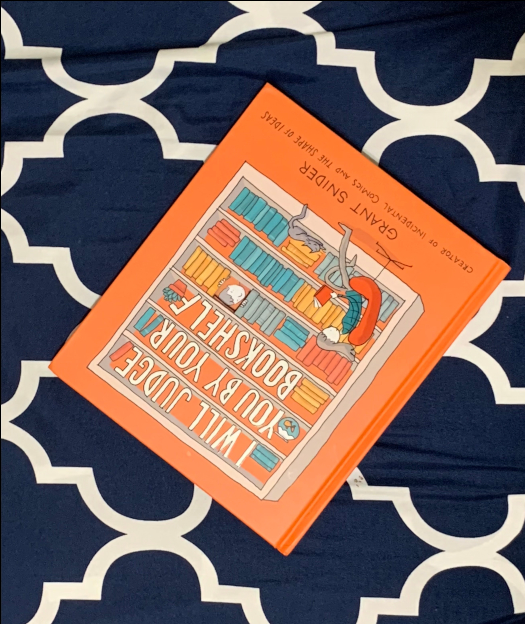

In [ ]:
book_to_rotate = cv2.cvtColor(book_rotation, cv2.COLOR_BGR2RGB)

angle_10 = rotate(book_to_rotate, 10)
angle_90 = rotate(book_to_rotate, 90)
angle_130 = rotate(book_to_rotate, 130)
angle_180 = rotate(book_to_rotate, 180)

print("10 degree rotation")
cv2_imshow(angle_10)
print("90 degree rotation")
cv2_imshow(angle_90)
print("130 degree rotation")
cv2_imshow(angle_130)
print("180 degree rotation")
cv2_imshow(angle_180)

###2.2.3 Compute SIFT keypoints for all (total 4) transformed images.

In [ ]:
angle_10_copy = computeSIFT(angle_10)
angle_90_copy = computeSIFT(angle_90)
angle_130_copy = computeSIFT(angle_130)
angle_180_copy = computeSIFT(angle_180)


### 2.2.4 Match all keypoints of the reference image to the transformed images using a brute-force method. 

In [ ]:
#Source inspiration : Tutorial 4 ECSE 415 Winter 2021

sift = cv2.xfeatures2d.SIFT_create()

#Reference image 
keypoints_ref_rot, descriptors_ref_rot = sift.detectAndCompute(book_to_rotate,None)

#Rotated images
keypoints_10,descriptors_10 = sift.detectAndCompute(angle_10,None)
keypoints_90,descriptors_90 = sift.detectAndCompute(angle_90,None)
keypoints_130,descriptors_130 = sift.detectAndCompute(angle_130,None)
keypoints_180,descriptors_180 = sift.detectAndCompute(angle_180,None)

bf = cv2.BFMatcher()


# Match descriptors.
matches_10 = bf.match(descriptors_ref_rot,descriptors_10)
matches_90 = bf.match(descriptors_ref_rot,descriptors_90)
matches_130 = bf.match(descriptors_ref_rot,descriptors_130)
matches_180 = bf.match(descriptors_ref_rot,descriptors_180)

### 2.2.5 Sort matching keypoints according to the matching distance

In [ ]:
matches_10 = sorted(matches_10, key = lambda x:x.distance)
matches_90 = sorted(matches_90, key = lambda x:x.distance)
matches_130 = sorted(matches_130, key = lambda x:x.distance)
matches_180 = sorted(matches_180, key = lambda x:x.distance)

### 2.2.6 Display top ten matched keypoints for each pair of the reference image and a transformed image.

Match between the reference image and the book rotated by 10 degrees


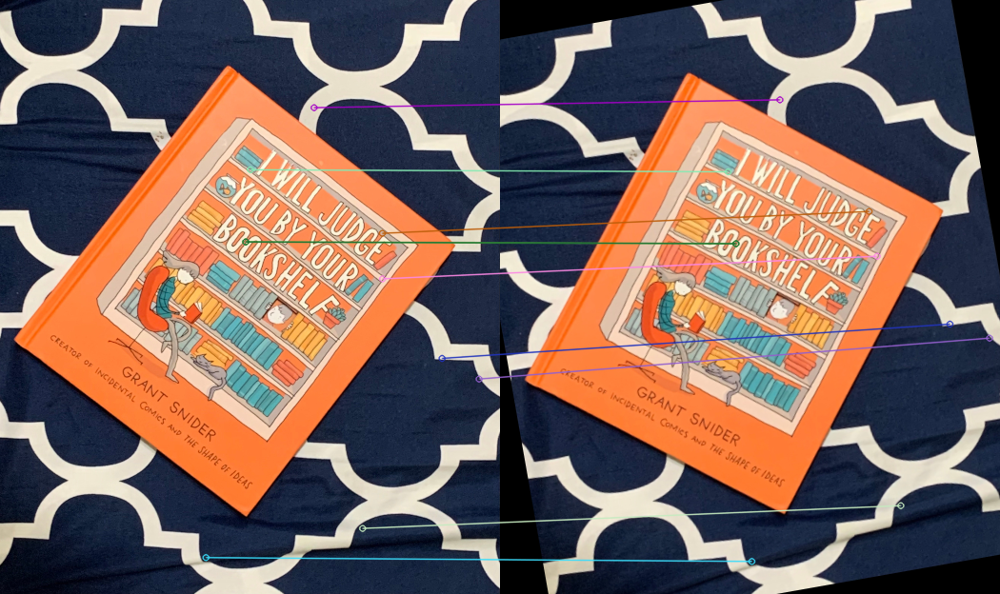

Match between the reference image and the book rotated by 90 degre


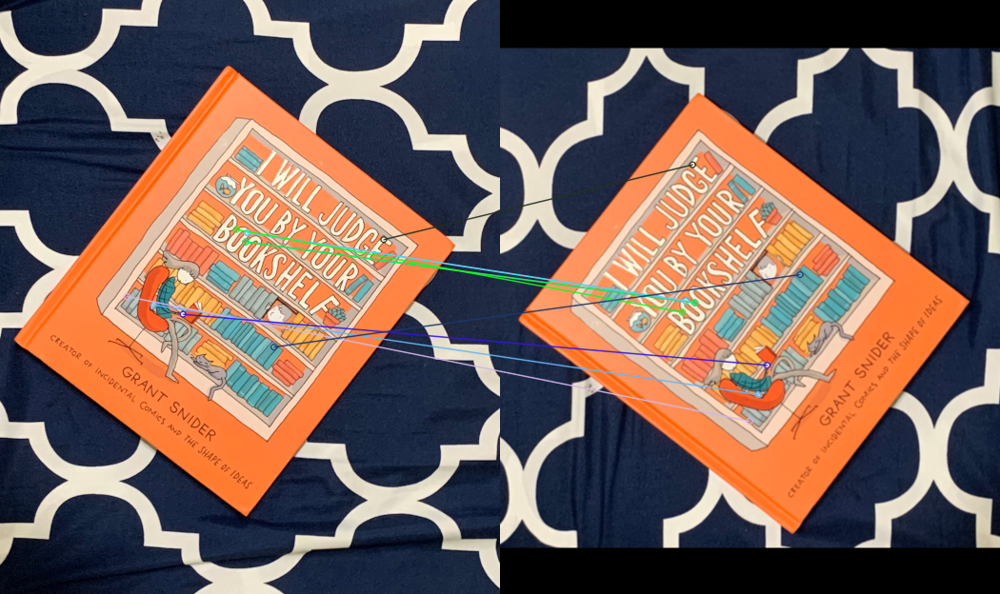

Match between the reference image and the book rotated by 130 degre


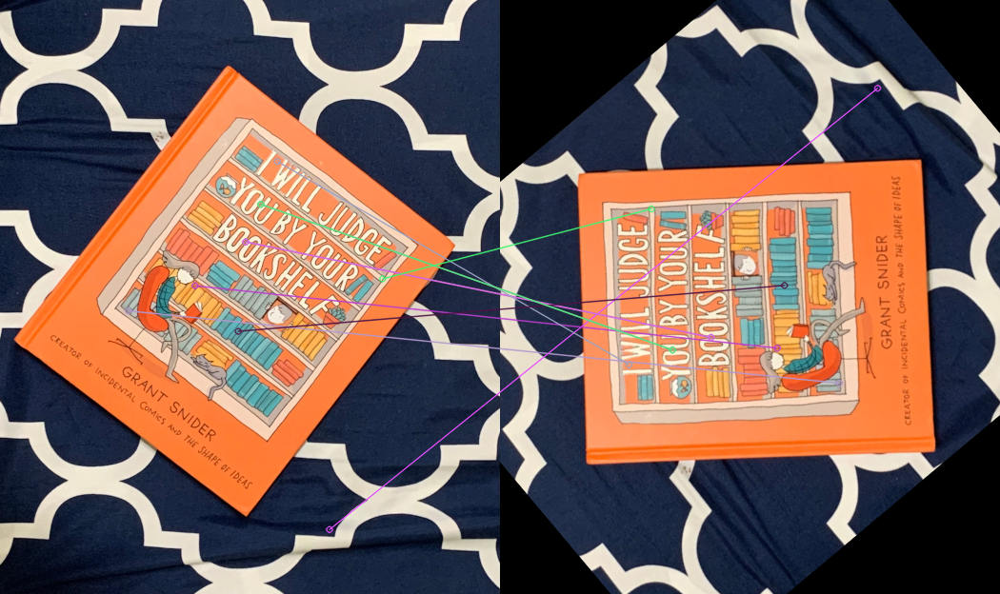

Match between the reference image and the book rotated by 180 degre


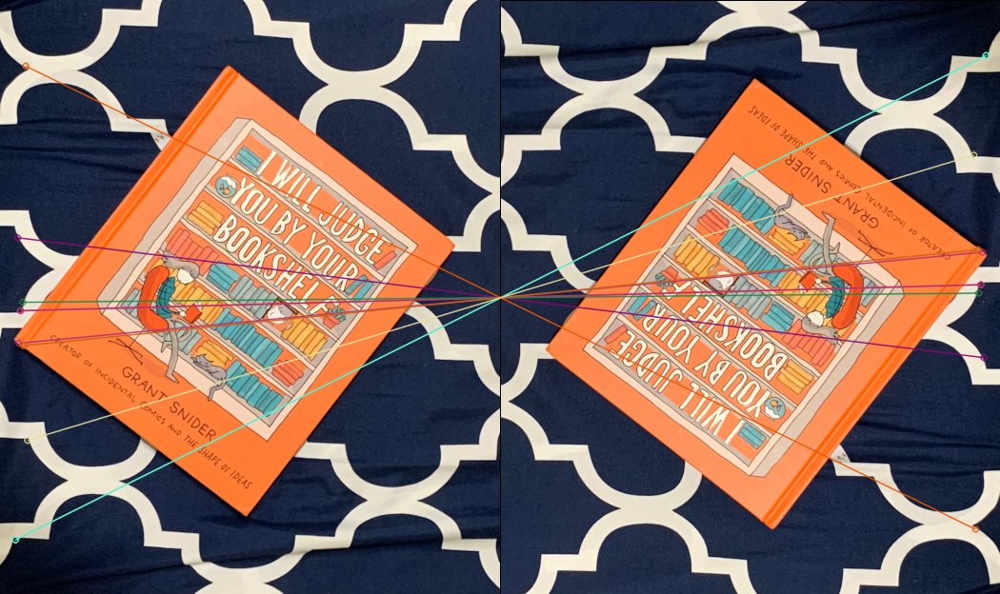

In [ ]:
book_10_match = cv2.drawMatches(book_to_rotate,keypoints_ref_rot, angle_10,keypoints_10, matches_10[:10], None, flags=2)
book_90_match = cv2.drawMatches(book_to_rotate,keypoints_ref_rot, angle_90 ,keypoints_90, matches_90[:10], None, flags=2)
book_130_match = cv2.drawMatches(book_to_rotate,keypoints_ref_rot, angle_130,keypoints_130, matches_130[:10], None, flags=2)
book_180_match = cv2.drawMatches(book_to_rotate,keypoints_ref_rot, angle_180,keypoints_180, matches_180[:10], None, flags=2)

print("Match between the reference image and the book rotated by 10 degrees")
cv2_imshow(book_10_match)
print("Match between the reference image and the book rotated by 90 degre")
cv2_imshow(book_90_match)
print("Match between the reference image and the book rotated by 130 degre")
cv2_imshow(book_130_match)
print("Match between the reference image and the book rotated by 180 degre")
cv2_imshow(book_180_match)

### 2.2.7 Plot the matching distance for the top 100 matched keypoints. Plot indices of keypoints on the x-axis and corresponding matching distance on the y- axis. 

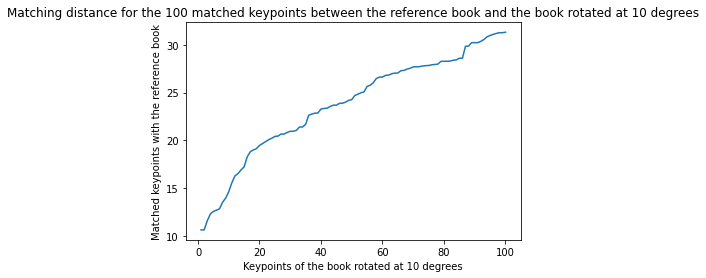

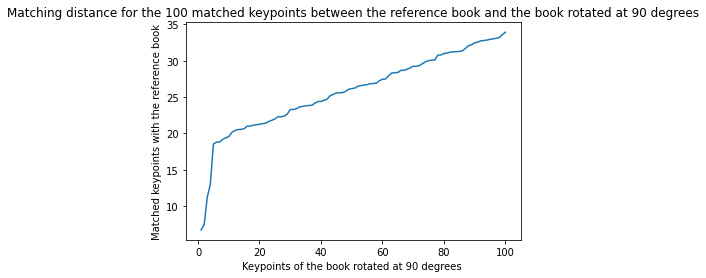

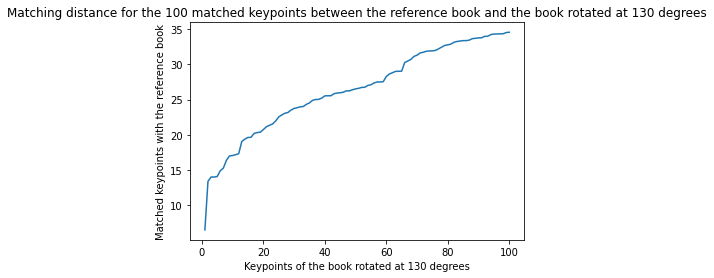

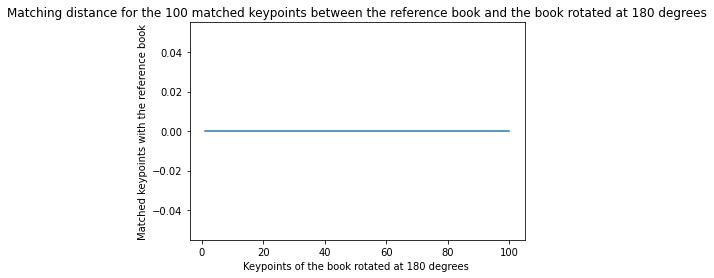

In [ ]:
import pandas as pd

#Books rotated

x_10, y_10 = createPlot(matches_10)
x_90, y_90 = createPlot(matches_90)
x_130, y_130 = createPlot(matches_130)
x_180, y_180 = createPlot(matches_180)
 
# function to show the plot 
plt.show() 

plt.plot(x_10, y_10) 
plt.xlabel('Keypoints of the book rotated at 10 degrees') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book rotated at 10 degrees')
plt.show()

plt.plot(x_90, y_90) 
plt.xlabel('Keypoints of the book rotated at 90 degrees ') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book rotated at 90 degrees')
plt.show()

plt.plot(x_130, y_130) 
plt.xlabel('Keypoints of the book rotated at 130 degrees') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book rotated at 130 degrees')
plt.show()

plt.plot(x_180, y_180) 
plt.xlabel('Keypoints of the book rotated at 180 degrees ') 
plt.ylabel('Matched keypoints with the reference book') 
plt.title('Matching distance for the 100 matched keypoints between the reference book and the book rotated at 180 degrees')
plt.show()

### 2.2.8 Discuss the trend in the plotted results. What is the effect of increasing the angle of rotation on the matching distance? Reason the cause. 

As seen from the plots above, there is a positive correlation between matched keypoints with the reference book and the keypoints of the book rotated at differing angles, indicating that the angle of rotation has a weak effect on matching distance, with the exception of the 180 degree rotation. 

The non-180 degree rotations cause the pixel values to change and the values are not mirroring, which results in features that are not completely identical and allow us to capture matches. However, for the 180 degree rotation, since this can be interpreted as a flip along the vertical axis, the transformations will give the same values as the "flipped" ones, which means the features produced are identical and matching. 